In [1]:

# Data anaysis
import pandas as pd
import numpy as np

# Plotting and Correlation Maths
import seaborn as sns
import scipy as sci

# Simple model development
import sklearn as sk

import matplotlib.pyplot as plt

import plotly as px


import os

# Data import and initial check

In [2]:
data = pd.read_csv('../data/interim/merged_df.csv')

In [3]:
data

,date,name,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,age_range,race,ethnicity_desc,accidental_exposure,victim_od_drug_id,susp_od_drug_desc,naloxone_administered,administration_id,survive,dose_unit
0,2018-01-07,Allegheny County,26.2,-4.2,10.1,18.1,-16.6,0.6,-3.8,57.2,...,30 - 39,BLACK,Unknown,N,3288,HEROIN,N,0,Y,0
1,2018-01-09,Allegheny County,35.8,28.0,32.5,34.7,24.1,26.8,26.6,78.9,...,40 - 49,WHITE,NON-HISPANIC OR NOT LATINO,N,527,HEROIN,Y,244,Y,0
2,2018-01-14,Allegheny County,15.3,2.5,9.2,14.6,-6.0,3.5,0.5,68.0,...,40 - 49,WHITE,NON-HISPANIC OR NOT LATINO,N,800,HEROIN,Y,454,Y,0
3,2018-01-14,Allegheny County,15.3,2.5,9.2,14.6,-6.0,3.5,0.5,68.0,...,20 - 24,WHITE,NON-HISPANIC OR NOT LATINO,N,804,HEROIN,Y,457,Y,0
4,2018-01-14,Allegheny County,15.3,2.5,9.2,14.6,-6.0,3.5,0.5,68.0,...,30 - 39,WHITE,NON-HISPANIC OR NOT LATINO,N,799,HEROIN,Y,452,Y,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5308,2024-04-13,Allegheny County,59.2,44.5,51.1,59.2,37.4,47.9,33.0,51.5,...,20 - 24,WHITE,NON-HISPANIC OR NOT LATINO,N,55826,HEROIN,Y,25971,Y,4
5309,2024-04-13,Allegheny County,59.2,44.5,51.1,59.2,37.4,47.9,33.0,51.5,...,20 - 24,WHITE,NON-HISPANIC OR NOT LATINO,N,55825,FENTANYL,Y,25971,Y,4
5310,2024-04-13,Allegheny County,59.2,44.5,51.1,59.2,37.4,47.9,33.0,51.5,...,20 - 24,WHITE,NON-HISPANIC OR NOT LATINO,N,55825,FENTANYL,Y,25972,Y,4
5311,2024-04-14,Allegheny County,81.1,45.0,64.1,79.9,39.9,62.9,39.5,42.6,...,20 - 24,WHITE,NON-HISPANIC OR NOT LATINO,N,55849,HEROIN,Y,25981,Y,4


# Simple Histogram if we need more of them in the future

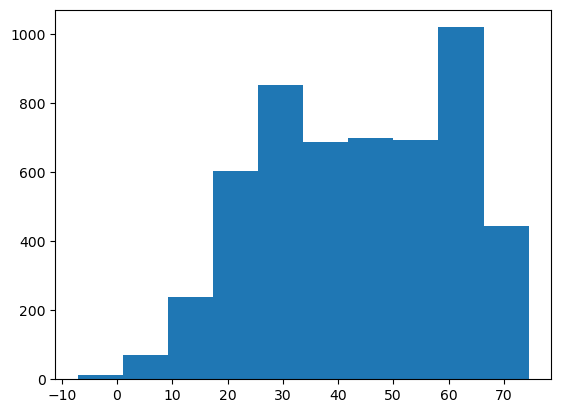

In [4]:
plt.hist(data['dew']);

# How many NAs exist

In [5]:
# A DataFrame where values have been assigned True is they are NA
nas = data.isna()
# Sum to find out how many values are missing
print("The number of missing values for each column:")
nas.sum()

The number of missing values for each column:


date                     0
name                     0
tempmax                  0
tempmin                  0
temp                     0
feelslikemax             0
feelslikemin             0
feelslike                0
dew                      0
humidity                 0
precip                   0
precipcover              0
preciptype               0
snow                     0
snowdepth                0
cloudcover               0
uvindex                  0
severerisk               0
moonphase                0
icon                     0
dose_count               0
incident_id              0
incident_time            0
day                      0
incident_county_name     0
incident_state           0
victim_id                0
gender_desc              0
age_range                0
race                     0
ethnicity_desc           0
accidental_exposure      0
victim_od_drug_id        0
susp_od_drug_desc        0
naloxone_administered    0
administration_id        0
survive                  0
d

# Basic Statistics on features

In [20]:
cols = data.columns
data[cols[0:12]].describe()

,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,precipcover
count,5313.000000,5313.000000,5313.000000,5313.000000,5313.000000,5313.000000,5313.000000,5313.000000,5313.000000,5313.000000
mean,63.154451,46.716958,54.710615,62.299228,43.387220,52.603633,43.496217,68.885695,0.124443,15.511656
std,17.795813,16.034096,16.552572,19.953740,19.496573,19.376105,17.085130,13.929217,0.288982,21.746015
min,11.400000,-5.000000,3.800000,2.700000,-30.400000,-13.200000,-7.100000,26.000000,0.000000,0.000000
25%,48.500000,32.800000,40.500000,45.200000,26.300000,35.900000,29.000000,59.200000,0.000000,0.000000
50%,66.800000,47.200000,56.000000,66.800000,45.100000,55.800000,44.000000,70.100000,0.004000,4.170000
75%,78.600000,61.700000,69.800000,78.600000,61.700000,69.800000,59.200000,79.300000,0.107000,25.000000
max,93.700000,75.500000,83.300000,100.600000,75.500000,87.200000,74.500000,99.200000,3.922000,100.000000


In [21]:
data[cols[12:]].describe()

,snow,snowdepth,cloudcover,uvindex,severerisk,moonphase,dose_count,incident_id,victim_id,victim_od_drug_id,administration_id,dose_unit
count,5313.000000,5313.000000,5313.000000,5313.000000,5313.000000,5313.000000,5313.000000,5313.000000,5313.000000,5313.00000,5313.000000,5313.000000
mean,0.036138,0.048598,55.061227,4.835498,5.673819,0.486302,1.211745,23751.618483,19052.305477,26789.17316,10707.597967,1.591568
std,0.184275,0.181906,29.470442,2.456176,11.179395,0.288306,0.991567,13818.946340,11163.164342,16297.51962,8726.860213,1.698118
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,54.000000,29.000000,38.00000,0.000000,0.000000
25%,0.000000,0.000000,29.800000,3.000000,0.000000,0.250000,1.000000,12507.000000,9956.000000,13262.00000,1428.000000,0.000000
50%,0.000000,0.000000,56.100000,5.000000,0.000000,0.500000,1.000000,23636.000000,18786.000000,25843.00000,9756.000000,2.000000
75%,0.000000,0.000000,80.700000,7.000000,10.000000,0.750000,2.000000,36288.000000,29232.000000,41637.00000,18922.000000,4.000000
max,2.900000,2.400000,100.000000,10.000000,100.000000,0.980000,9.000000,47860.000000,38573.000000,55849.00000,26100.000000,4.000000


In [35]:
for col in cols:
    print(data[col].value_counts())



date
2018-11-30    20
2020-01-16    19
2018-04-20    17
2018-06-18    16
2023-01-07    16
              ..
2020-05-27     1
2020-06-05     1
2022-09-21     1
2022-09-20     1
2018-01-07     1
Name: count, Length: 1734, dtype: int64
name
Allegheny County    5313
Name: count, dtype: int64
tempmax
79.6    46
78.4    44
57.8    44
75.7    35
83.9    33
        ..
55.3     1
47.9     1
28.2     1
30.2     1
56.6     1
Name: count, Length: 590, dtype: int64
tempmin
 64.9    47
 31.9    43
 56.3    40
 62.6    38
 26.6    38
         ..
 22.1     1
 8.2      1
 17.4     1
 40.3     1
-4.2      1
Name: count, Length: 550, dtype: int64
temp
71.2    33
70.1    31
71.0    30
64.6    30
74.6    30
        ..
48.2     1
24.8     1
11.6     1
21.6     1
10.1     1
Name: count, Length: 579, dtype: int64
feelslikemax
79.6    55
78.4    44
57.8    44
75.7    35
78.6    31
        ..
55.5     1
33.5     1
34.6     1
14.9     1
24.4     1
Name: count, Length: 643, dtype: int64
feelslikemin
 64.9    47
 5

# Pair plot

Has both histogram distribution as well as general correlation information via shape for all features vs features.

c:\Users\btb51\anaconda3\envs\opioid_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\btb51\anaconda3\envs\opioid_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\btb51\anaconda3\envs\opioid_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\btb51\anaconda3\envs\opioid_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed

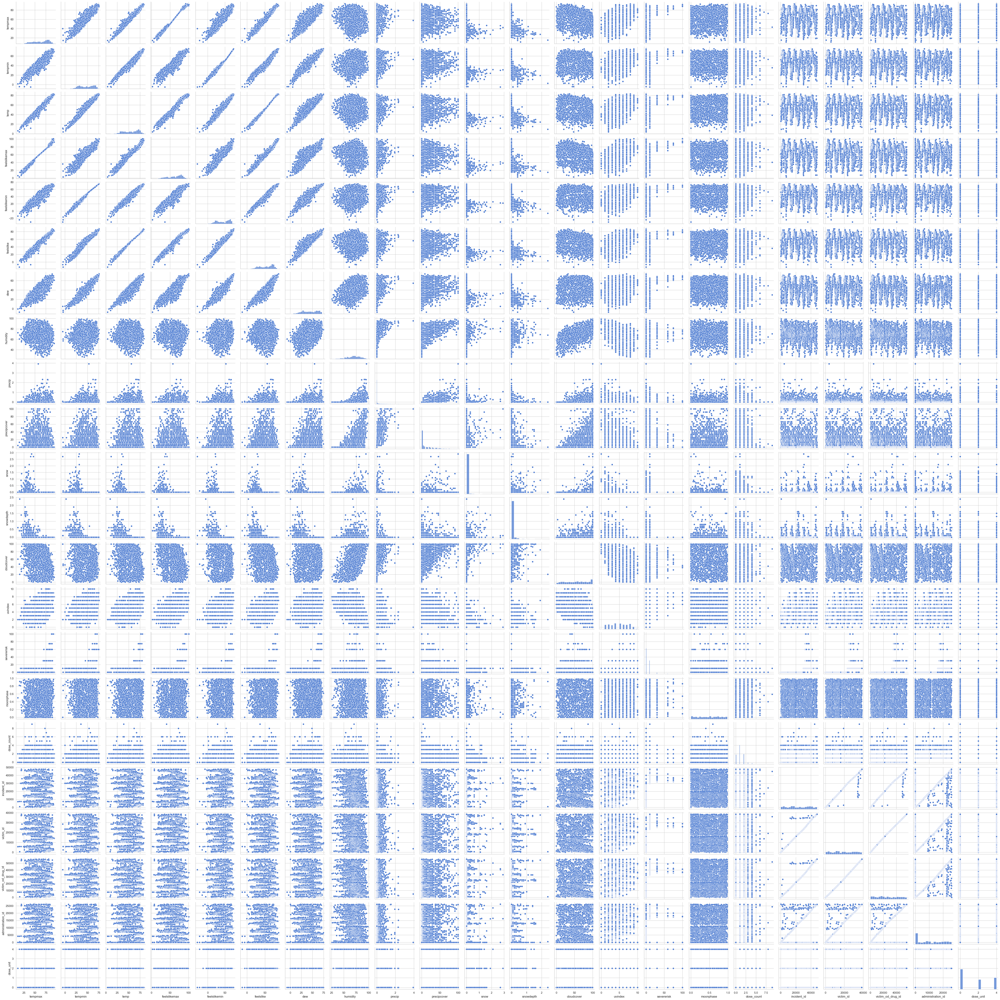

In [6]:
sns.set_theme(style='whitegrid', palette='muted')
sns.pairplot(data)

# Looking for any outliers in the dataset

Uses z-score of 3 to detect outliers

In [37]:
cols

Index(['date', 'name', 'tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipcover',
       'preciptype', 'snow', 'snowdepth', 'cloudcover', 'uvindex',
       'severerisk', 'moonphase', 'icon', 'dose_count', 'incident_id',
       'incident_time', 'day', 'incident_county_name', 'incident_state',
       'victim_id', 'gender_desc', 'age_range', 'race', 'ethnicity_desc',
       'accidental_exposure', 'victim_od_drug_id', 'susp_od_drug_desc',
       'naloxone_administered', 'administration_id', 'survive', 'dose_unit'],
      dtype='object')

In [44]:
num_cols = ['tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipcover',
       'snowdepth', 'cloudcover', 'uvindex', 'severerisk', 'moonphase']

# Z-scores
for col in num_cols:
    data['z_score'] = (data[col] - data[col].mean()) / data[col].std()

thresh = 3 # Three std away for an outlier
outliers = data[np.abs(data['z_score']) > thresh]
outliers
# There are no outliers

,date,name,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,race,ethnicity_desc,accidental_exposure,victim_od_drug_id,susp_od_drug_desc,naloxone_administered,administration_id,survive,dose_unit,z_score
